In [9]:
from src.WGS import WGS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
from joblib import Parallel, delayed
from tqdm import tqdm

import os
path_border = "src/csv/polygon_border.csv"
path_obs = "src/csv/polygon_obstacle.csv"

plg_border = pd.read_csv(path_border).to_numpy()
plg_obs = pd.read_csv(path_obs).to_numpy()



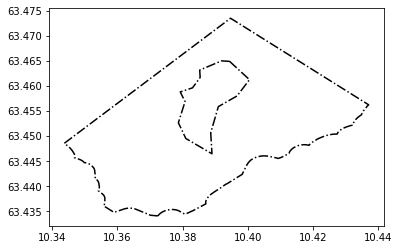

In [10]:
plt.plot(plg_obs[:, 1], plg_obs[:, 0], 'k-.')
plt.plot(plg_border[:, 1], plg_border[:, 0], 'k-.')


In [11]:
x_border, y_border = WGS.latlon2xy(plg_border[:, 0], plg_border[:, 1])
xmin, ymin = map(np.amin, [x_border, y_border])
xmax, ymax = map(np.amax, [x_border, y_border])
plg_border_xy = np.stack((x_border, y_border), axis=1)
plg_border_shapely = Polygon(plg_border_xy)

x_obs, y_obs = WGS.latlon2xy(plg_obs[:, 0], plg_obs[:, 1])
plg_obs_xy = np.stack((x_obs, y_obs), axis=1)
plg_obs_shapely = Polygon(plg_obs_xy)

def get_random_locations(n):
    locations = []
    for i in tqdm(range(n)):  
        xr = np.random.uniform(xmin, xmax)
        yr = np.random.uniform(ymin, ymax)
        point = Point(xr, yr)
        if plg_border_shapely.contains(point) and not plg_obs_shapely.contains(point):
            locations.append([xr, yr])
    locs = np.array(locations)
    print("Acceptance rate: ", len(locs) / n)
    print("Total {:d} random locations are generated!".format(len(locs)))
    print("Can be used for {:d} iterations in RRT* planning".format(int(len(locs)/2000)))
    return locs

TT = 800000 * np.ones(12).astype(int)
res = Parallel(n_jobs=5)(delayed(get_random_locations)(tt) for tt in TT)

rest = np.empty([0, 2])
for i in range(len(res)):
    rest = np.append(rest, res[0], axis=0)

  0%|          | 0/800000 [00:00<?, ?it/s]

Acceptance rate:  0.4597075
Total 367766 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.4589325
Total 367146 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.45992625
Total 367941 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.4585875
Total 366870 random locations are generated!
Can be used for 183 iterations in RRT* planning


  0%|          | 1699/800000 [00:00<00:47, 16973.71it/s]

Acceptance rate:  0.45953875
Total 367631 random locations are generated!
Can be used for 183 iterations in RRT* planning


100%|██████████| 800000/800000 [00:58<00:00, 13707.40it/s]


Acceptance rate:  0.45935125
Total 367481 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.46049625
Total 368397 random locations are generated!
Can be used for 184 iterations in RRT* planning


100%|██████████| 800000/800000 [00:44<00:00, 17788.99it/s]


Acceptance rate:  0.4601325
Total 368106 random locations are generated!
Can be used for 184 iterations in RRT* planning
Acceptance rate:  0.45901125
Total 367209 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.46000125
Total 368001 random locations are generated!
Can be used for 184 iterations in RRT* planning
Acceptance rate:  0.45942125
Total 367537 random locations are generated!
Can be used for 183 iterations in RRT* planning
Acceptance rate:  0.459555
Total 367644 random locations are generated!
Can be used for 183 iterations in RRT* planning


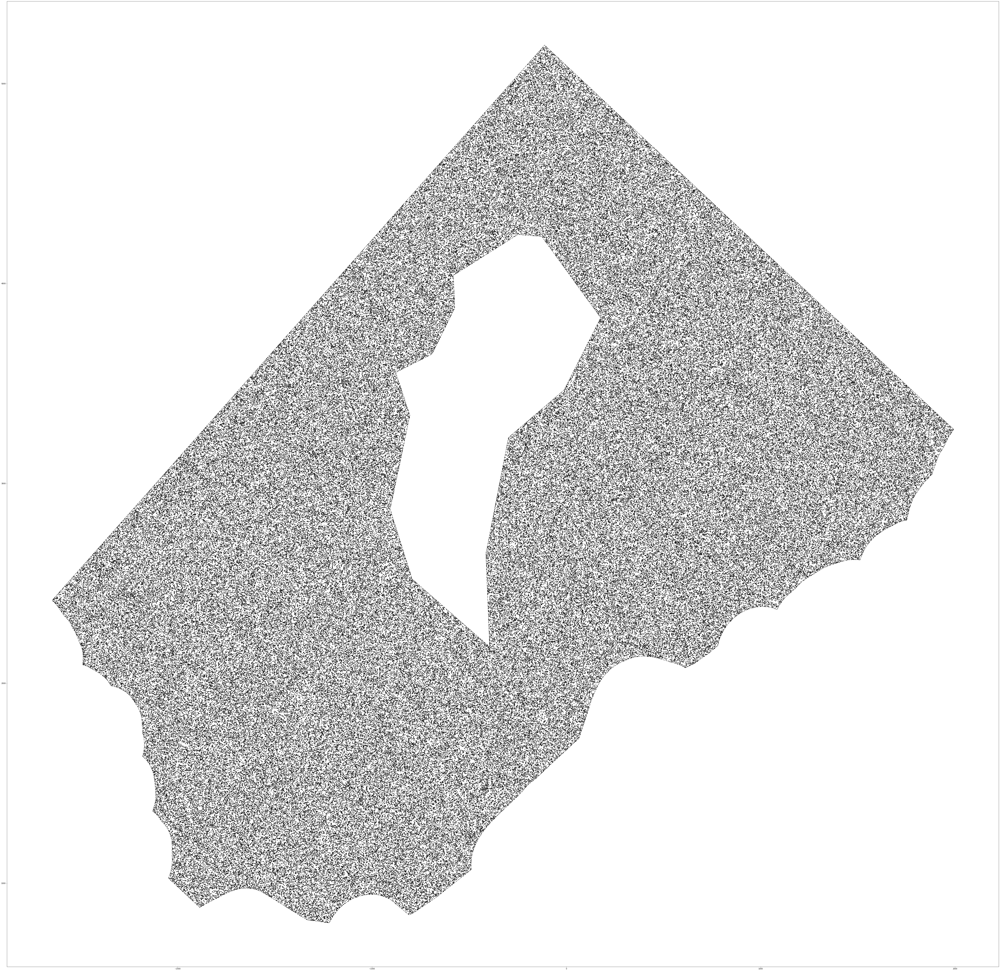

In [4]:
plt.figure(figsize=(100, 100))
plt.plot(plg_border_xy[:, 1], plg_border_xy[:, 0], 'k-.')
plt.plot(plg_obs_xy[:, 1], plg_obs_xy[:, 0], 'k-.')
plt.plot(rest[:, 1], rest[:, 0], 'k.', alpha=.1)

In [5]:
indices = np.random.uniform(0, 1., len(rest))  # get random indices used for rrt* planning

np.save("RRT_Random_Locations.npy", rest)
np.save("Goal_indices.npy", indices)
